In [2]:
import os
import sys
import json
from pathlib import Path
sys.path.append(os.path.abspath('..'))

# ----------- local imports ----------- 
from utils import show_images, make_grid
from constants import TRAIN_PATH

In [3]:
import torch
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision import transforms
from diffusers import AutoencoderKL
from torchvision.transforms import functional as F


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = torch.Generator(device=device).manual_seed(42)
# dtype = torch.bfloat16
dtype = torch.float32

# Load HQ Image

In [4]:
img_path = TRAIN_PATH / "WOMEN_Skirts_id_00007488_02_1_front.png"
img = Image.open(img_path)
img.size

(750, 1101)

In [5]:
class BottomCenterCrop:
    def __init__(self, size):
        self.size = size

    def __call__(self, img):
        w, h = img.size  # Original width and height
        new_h, new_w = self.size
        
        left = (w - new_w) // 2
        return F.crop(img, 0, left, new_h, new_w)

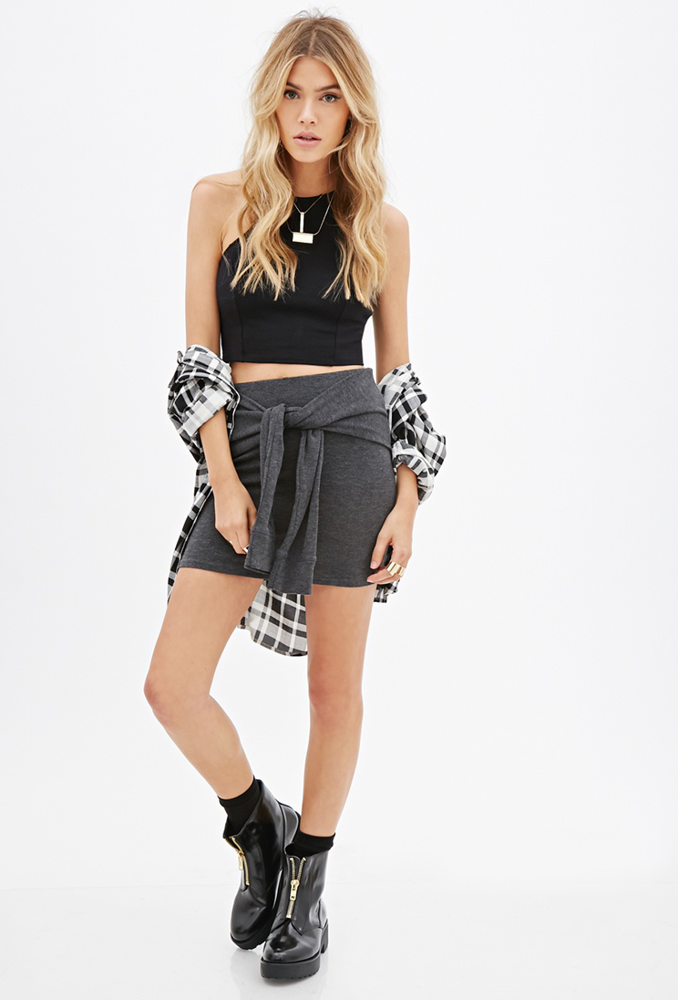

In [6]:
original_image = (1101, 750)
# make it smaller
# image_resize = (367, 250) # divided by 3 (H, W)
# image_crop = (360, 248) # H, W


image_resize = (1101, 750) # divided by 3 (H, W)
image_crop = (1096, 744) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img)
show_images(img_clean)

# Try  VAE

In [7]:
vae_link = "https://huggingface.co/stabilityai/sd-vae-ft-mse-original/vae-ft-mse-840000-ema-pruned.ckpt"

vae_mse = AutoencoderKL().from_single_file(vae_link, torch_dtype=dtype).to(device)
vae_sd_15 = AutoencoderKL().from_pretrained("SG161222/Realistic_Vision_V6.0_B1_noVAE", subfolder="vae", torch_dtype=dtype).to(device)
vae_sd_2 = AutoencoderKL().from_pretrained("stabilityai/stable-diffusion-2-1-base", subfolder="vae", torch_dtype=dtype).to(device)

An error occurred while trying to fetch SG161222/Realistic_Vision_V6.0_B1_noVAE: SG161222/Realistic_Vision_V6.0_B1_noVAE does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [8]:
# def encode_image(img_clean, vae):
def encode_vae(img_clean, vae):
    img_clean = img_clean.unsqueeze(0).to(device)
    with torch.no_grad():
        img_latents = vae.encode(img_clean).latent_dist.sample() * vae.config.scaling_factor
    return img_latents

def decode_vae(img_latents, vae):
    outputs = img_latents / vae.config.scaling_factor
    with torch.no_grad():
        outputs  = vae.decode(outputs).sample
    return outputs

In [9]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)

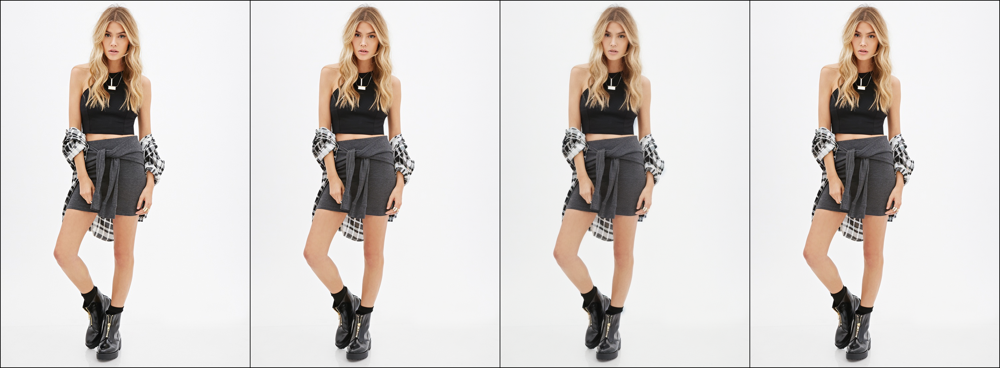

In [10]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2])

show_images(show)

**MSE wining**

# Try VAE on LQ image

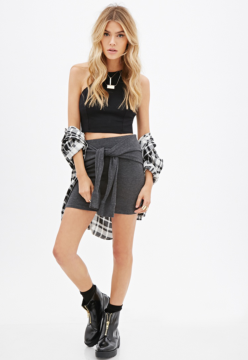

In [11]:
original_image = (1101, 750)
# make it smaller
image_resize = (367, 250) # divided by 3 (H, W)
image_crop = (360, 248) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img)
show_images(img_clean)

In [12]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)

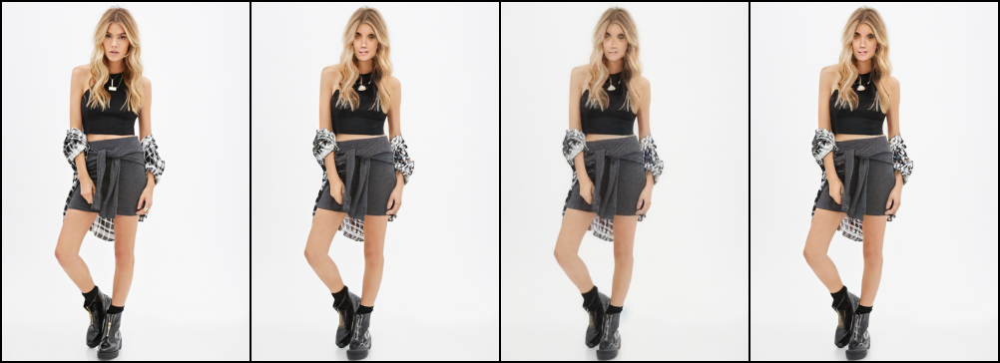

In [13]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2])

show_images(show)

# Try VAE on bFloat16

In [18]:
dtype = torch.bfloat16
# go to float
vae_mse.type(dtype)
vae_sd_15.type(dtype)
vae_sd_2.type(dtype)

image_resize = (1101, 750) # divided by 3 (H, W)
image_crop = (1096, 744) # H, W

transform = transforms.Compose([
    transforms.Resize(image_resize),
    BottomCenterCrop(image_crop),  # Custom bottom-center crop
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])


img_clean = transform(img).type(dtype).to(device)

In [19]:
x_mse   = decode_vae(encode_vae(img_clean, vae_mse), vae_mse)
x_sd_15 = decode_vae(encode_vae(img_clean, vae_sd_15), vae_sd_15)
x_sd_2  = decode_vae(encode_vae(img_clean, vae_sd_2), vae_sd_2)

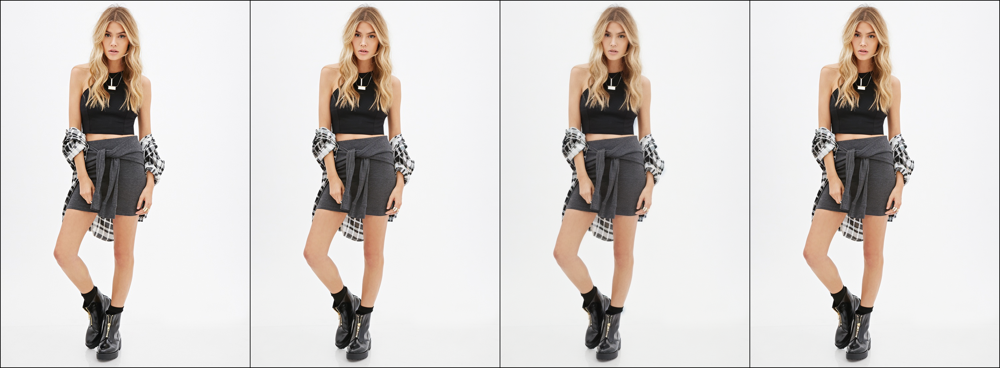

In [20]:
show = torch.cat([img_clean.to(device).unsqueeze(0), x_mse, x_sd_15, x_sd_2]).type(torch.float32)

show_images(show)

**Same as HQ** 